In [0]:
import requests
 
req = requests.get("https://covid.ourworldindata.org/data/owid-covid-data.csv")
 
with open("/databricks/driver/owid-covid-data.csv", "w+") as f:
  f.write(req.text)
  
dbutils.fs.cp("file:/databricks/driver/owid-covid-data.csv", "dbfs:/FileStore/tables/covid/owid-covid-data.csv")


Out[1]: True

In [0]:
dbutils.fs.cp("dbfs:/FileStore/tables/covid/owid-covid-data.csv", "file:/databricks/driver/owid-covid-data.csv")
df = spark.read.csv("file:/databricks/driver/owid-covid-data.csv", header=True, inferSchema=True)
display(df)


iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
AFG,Asia,Afghanistan,2020-01-03,null,0.0,null,null,0.0,null,null,0.0,null,null,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,54.422,18.6,2.581,1.337,1803.987,null,597.029,9.59,null,null,37.746,0.5,64.83,0.511,4.1128772E7,null,null,null,null
AFG,Asia,Afghanistan,2020-01-04,null,0.0,null,null,0.0,null,null,0.0,null,null,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,54.422,18.6,2.581,1.337,1803.987,null,597.029,9.59,null,null,37.746,0.5,64.83,0.511,4.1128772E7,null,null,null,null
AFG,Asia,Afghanistan,2020-01-05,null,0.0,null,null,0.0,null,null,0.0,null,null,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,54.422,18.6,2.581,1.337,1803.987,null,597.029,9.59,null,null,37.746,0.5,64.83,0.511,4.1128772E7,null,null,null,null
AFG,Asia,Afghanistan,2020-01-06,null,0.0,null,null,0.0,null,null,0.0,null,null,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,54.422,18.6,2.581,1.337,1803.987,null,597.029,9.59,null,null,37.746,0.5,64.83,0.511,4.1128772E7,null,null,null,null
AFG,Asia,Afghanistan,2020-01-07,null,0.0,null,null,0.0,null,null,0.0,null,null,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,54.422,18.6,2.581,1.337,1803.987,null,597.029,9.59,null,null,37.746,0.5,64.83,0.511,4.1128772E7,null,null,null,null
AFG,Asia,Afghanistan,2020-01-08,null,0.0,0.0,null,0.0,0.0,null,0.0,0.0,null,0.0,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,54.422,18.6,2.581,1.337,1803.987,null,597.029,9.59,null,null,37.746,0.5,64.83,0.511,4.1128772E7,null,null,null,null
AFG,Asia,Afghanistan,2020-01-09,null,0.0,0.0,null,0.0,0.0,null,0.0,0.0,null,0.0,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,54.422,18.6,2.581,1.337,1803.987,null,597.029,9.59,null,null,37.746,0.5,64.83,0.511,4.1128772E7,null,null,null,null
AFG,Asia,Afghanistan,2020-01-10,null,0.0,0.0,null,0.0,0.0,n

In [0]:
# take care of the Null vlaues 
#df.na.fill(0,'total_cases')
#display(df[4][1])
#total_death_df = df.na.fill(0, subset=['total_death'])

# take care of the Null values in the columns
df = df.na.fill({'total_cases': 0, 'total_deaths': 0, 'new_cases_smoothed': 0, 'new_deaths_smoothed': 0, 'total_cases_per_million': 0, 'new_cases_smoothed_per_million': 0, 'total_deaths_per_million': 0,'icu_patients':0,'icu_patients_per_million':0,'hosp_patients':0,'hosp_patients_per_million':0,'weekly_icu_admissions':0,'weekly_icu_admissions_per_million':0,'weekly_hosp_admissions':0,'weekly_hosp_admissions_per_million':0,'total_tests':0,'new_tests':0,'total_tests_per_thousand':0,'new_tests_per_thousand':0,'new_tests_smoothed':0,'new_tests_smoothed_per_thousand':0,'positive_rate':0,'tests_per_case':0,'total_vaccinations':0,'people_vaccinated':0,'people_fully_vaccinated':0,'total_boosters':0,'new_vaccinations':0,'new_vaccinations_smoothed':0,'total_vaccinations_per_hundred':0,'people_vaccinated_per_hundred':0,'people_fully_vaccinated_per_hundred':0,'total_boosters_per_hundred':0,'new_vaccinations_smoothed_per_million':0,'new_people_vaccinated_smoothed':0,'new_people_vaccinated_smoothed_per_hundred':0,'new_people_vaccinated_smoothed_per_hundred':0,'stringency_index':0,'population_density':0,'median_age':0,'aged_65_older':0,'aged_70_older':0,'gdp_per_capita':0,'extreme_poverty':0,'cardiovasc_death_rate':0,'diabetes_prevalence':0,'female_smokers':0,'male_smokers':0,'handwashing_facilities':0,'hospital_beds_per_thousand':0,'life_expectancy':0,'human_development_index':0,'population':0,'excess_mortality_cumulative_absolute':0,'excess_mortality_cumulative':0,'excess_mortality':0,'excess_mortality_cumulative_per_million':0,'new_deaths_smoothed_per_million':0,'reproduction_rate':0})


In [0]:
from pyspark.sql.functions import *

# Fill null values in the specified continents with its mode
#df = df.na.fill({'continent': df.select('continent').agg(mode('continent')).first()[0]})

# Delete the columns that all the values are 0 
df.drop(['hosp_patients','hosp_patients_per_million','weekly_icu_admissions','weekly_icu_admissions_per_million','weekly_hosp_admissions','weekly_hosp_admissions_per_million'], axis=1, inplace=True)

display(df)

---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
<command-1137625965788440> in <cell line: 7>()
      5 
      6 # Delete the columns that all the values are 0
----> 7 df.drop(['hosp_patients','hosp_patients_per_million','weekly_icu_admissions','weekly_icu_admissions_per_million','weekly_hosp_admissions','weekly_hosp_admissions_per_million'], axis=1, inplace=True)
      8 
      9 display(df)

/databricks/spark/python/pyspark/instrumentation_utils.py in wrapper(*args, **kwargs)
     46             start = time.perf_counter()
     47             try:
---> 48                 res = func(*args, **kwargs)
     49                 logger.log_success(
     50                     module_name, class_name, function_name, time.perf_counter() - start, signature

TypeError: drop() got an unexpected keyword argument 'axis'

In [0]:
new_df = df.withColumn("continent", when(df["location"] == "Africa" , 'Africa').when(df["location"] == "Asia" , 'Asia').when(df["location"] == "Europe" , 'Europe').when(df["location"] == "European Union" , 'Europe').when(df["location"] == "High income" , 'n/a').when(df["location"] == "Lower middle income" , 'n/a').when(df["location"] == "Low income" , 'n/a').when(df["location"] == "North America" , 'North America').when(df["location"] == "Oceania" , 'Oceania').when(df["location"] == "South America" , 'South America').when(df["location"] == "World" , 'n/a').when(df["location"] == "Upper middle income" , 'n/a').otherwise(df["continent"]))

total_death = new_df.groupBy('continent',"location").sum("total_deaths")


continent,sum(total_deaths)
Europe,3.63191995E9
Africa,3.73991464E8
North America,2.244721337E9
South America,2.040494906E9
Oceania,1.9076842E7
Asia,2.073702058E9
n/a,9.537006809E9


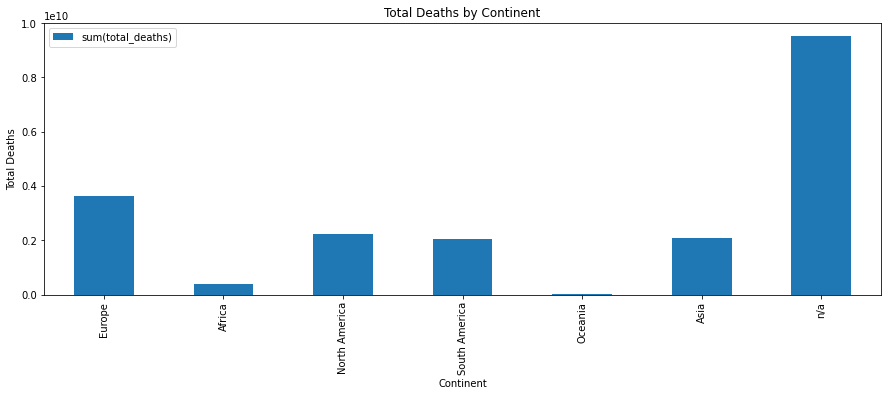

In [0]:
import matplotlib.pyplot as plt
import pandas as pd

# Cast 'total_deaths' column to float
#df = new_df.withColumn("total_deaths", df["total_deaths"].cast('float'))

# Group by 'continent' and calculate total deaths
total_death = new_df.groupBy("continent").sum("total_deaths")
display(total_death)

# Convert the result to a Pandas dataframe
total_death_pd = total_death.toPandas()

# Plot a bar chart of total deaths by continent and location
total_death_pd.plot(kind='bar', x='continent', y='sum(total_deaths)', figsize=(15, 5))
plt.title('Total Deaths by Continent')
plt.xlabel('Continent')
plt.ylabel('Total Deaths')
plt.show()



How many death cases in total for the past 3 years worldwide?  


In [0]:
import pandas as pd
from pyspark.sql.functions import year
 
# Create another column year and name parse it in another df
df_with_year = df.withColumn("year", year("date"))
total_deathBYyear = df_with_year.groupBy("year").sum("total_deaths")
#Sum by year
total_deathBYyear.show()

+----+-----------------+
|year|sum(total_deaths)|
+----+-----------------+
|2023|    3.324458573E9|
|2022|    9.612599102E9|
|2020|    1.018322294E9|
|2021|    5.965533397E9|
+----+-----------------+



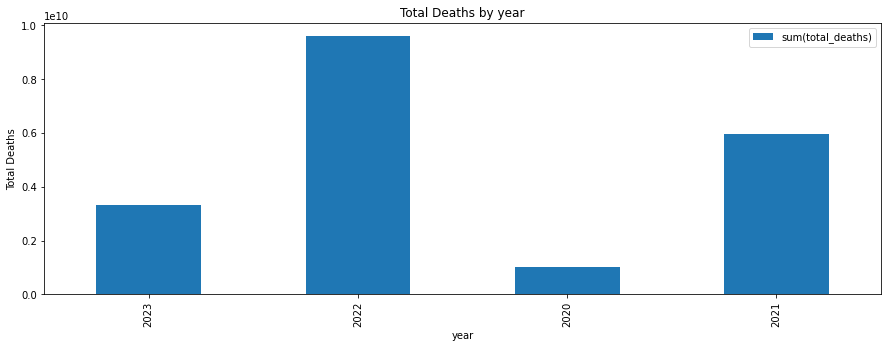

In [0]:
import matplotlib.pyplot as plt
import pandas as pd
 
# Cast 'total_deaths' column to float
#df = df_with_year.withColumn("total_deaths", df["total_deaths"].cast('float'))
 
# Group by 'continent' and calculate total deaths
total_death = df_with_year.groupBy("year").sum("total_deaths")
 
# Convert the result to a Pandas dataframe
total_death_pd = total_death.toPandas()
 
# Plot a bar chart of total deaths by continent and location
total_death_pd.plot(kind='bar', x='year', y='sum(total_deaths)', figsize=(15, 5))
plt.title('Total Deaths by year')
plt.xlabel('year')
plt.ylabel('Total Deaths')
plt.show()

How is the economy affected by covid throughout the world?   


continent,sum(gdp_per_capita)
Europe,1.696377842064897E9
Africa,3.491132752800018E8
North America,7.076016839650455E8
South America,2.011390650149987E8
Oceania,1.7990712425000054E8
Asia,1.3506891741269822E9
n/a,1.876414809100013E7


year,continent,sum(gdp_per_capita)
2022,Europe,5.1141827941500163E8
2020,South America,6.048065066699956E7
2020,Africa,1.0502250595199957E8
2021,Africa,1.0531102931999956E8
2023,null,1840835.6329999985
2022,null,5646260.555000027
2022,South America,6.062263939499956E7
2021,Asia,4.1702879899699926E8
2023,Asia,1.3252598976299968E8
2020,Oceania,5.410738933600006E7


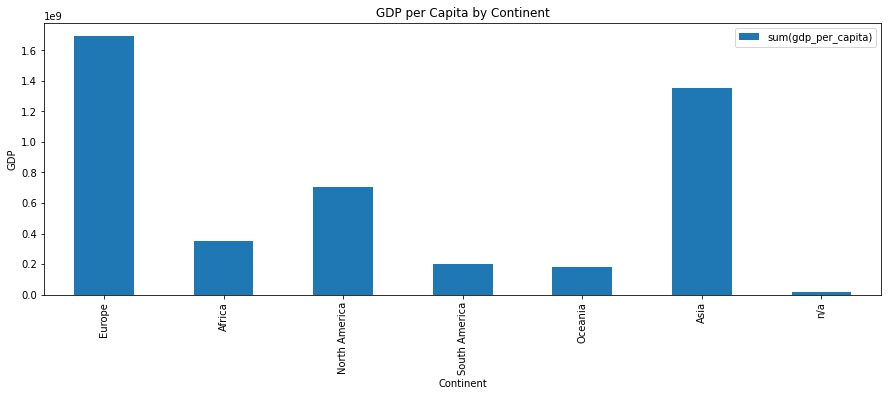

In [0]:
# Group by 'continent' and calculate total deaths
gdp = new_df.groupBy("continent").sum("gdp_per_capita")
display(gdp)

# Create another column year and name parse it in another df
#df_with_year = df.withColumn("year", year("date"))
GDP_continent_year = df_with_year.groupBy("year","continent").sum("gdp_per_capita")
display(GDP_continent_year)

# Convert the result to a Pandas dataframe
gdp_pd = gdp.toPandas()

# Plot a bar chart of total deaths by continent and location
gdp_pd.plot(kind='bar', x='continent', y='sum(gdp_per_capita)', figsize=(15, 5))
plt.title('GDP per Capita by Continent')
plt.xlabel('Continent')
plt.ylabel('GDP')
plt.show()


In [0]:
# Group by 'continent' and calculate total deaths
gdp = new_df.groupBy("continent").sum("gdp_per_capita")
display(gdp)

# Create another column year and name parse it in another df
df_with_year = new_df.withColumn("year", year("date"))
GDP_continent_year = df_with_year.groupBy("year","continent").sum("gdp_per_capita").orderBy("continent")
display(GDP_continent_year)

continent,sum(gdp_per_capita)
Europe,1.696377842064897E9
Africa,3.491132752800018E8
North America,7.076016839650455E8
South America,2.011390650149987E8
Oceania,1.7990712425000054E8
Asia,1.3506891741269822E9
n/a,1.876414809100013E7


year,continent,sum(gdp_per_capita)
2020,Africa,1.0502250595199957E8
2021,Africa,1.0531102931999956E8
2022,Africa,1.0531102931999956E8
2023,Africa,3.346871068799994E7
2021,Asia,4.1702879899699926E8
2023,Asia,1.3252598976299968E8
2020,Asia,3.801208360320005E8
2022,Asia,4.210135493349993E8
2022,Europe,5.1141827941500163E8
2020,Europe,5.100171334440021E8


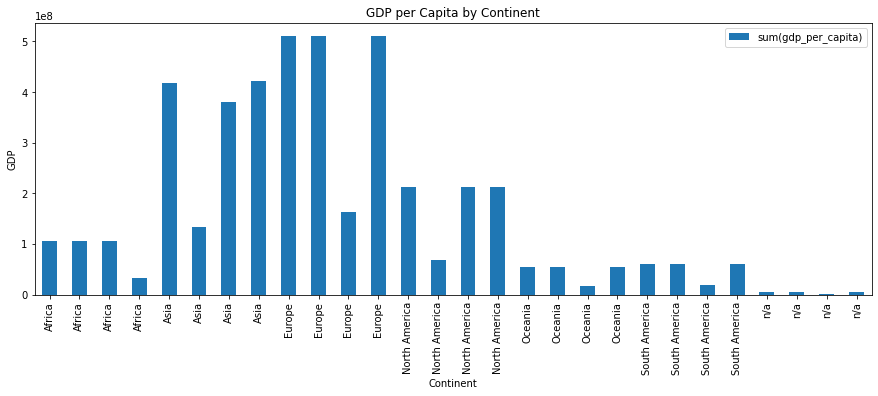

In [0]:
# Convert the result to a Pandas dataframe
gdp_pd = GDP_continent_year.toPandas()

# Plot a bar chart of total deaths by continent and location
gdp_pd.plot(kind='bar', x='continent', y='sum(gdp_per_capita)', figsize=(15, 5))
plt.title('GDP per Capita by Continent')
plt.xlabel('Continent')
plt.ylabel('GDP')
plt.show()


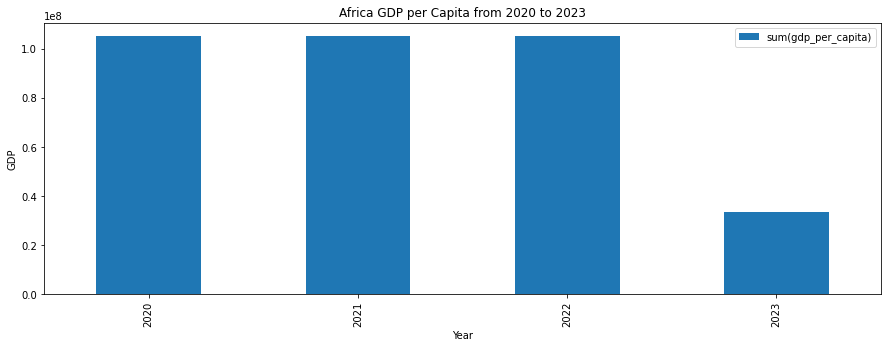

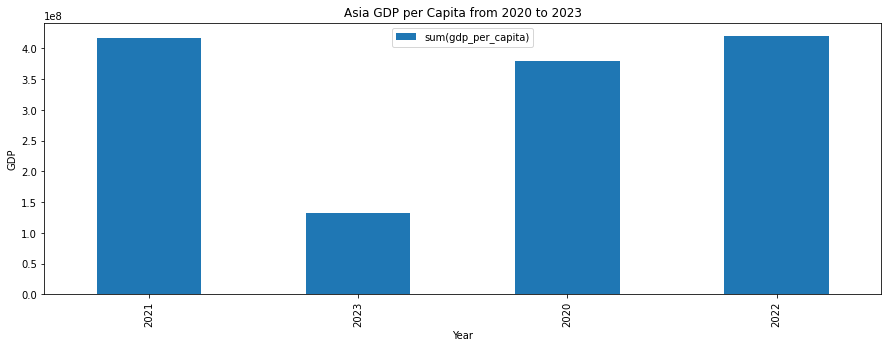

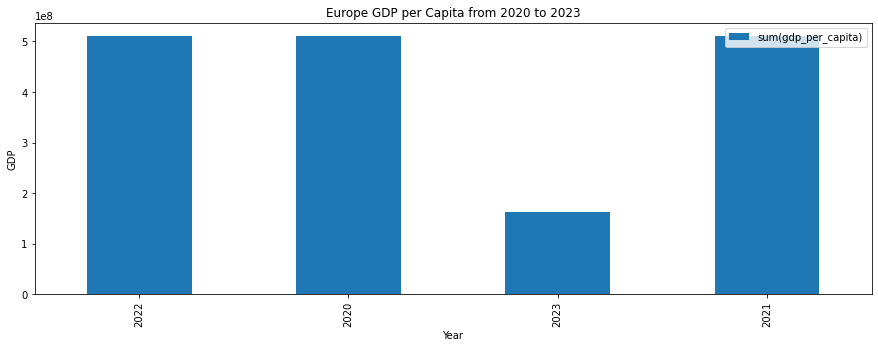

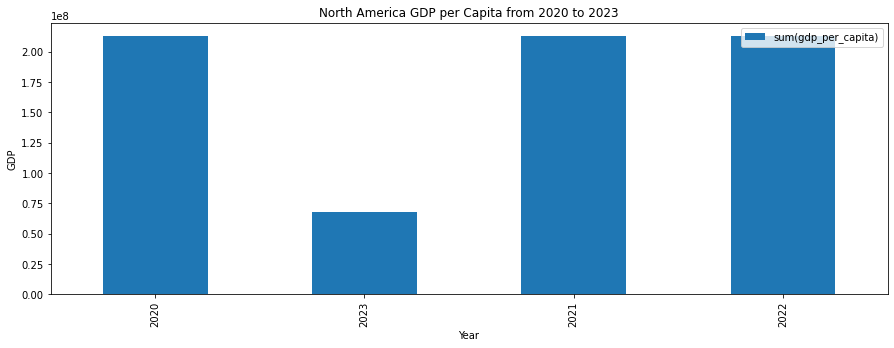

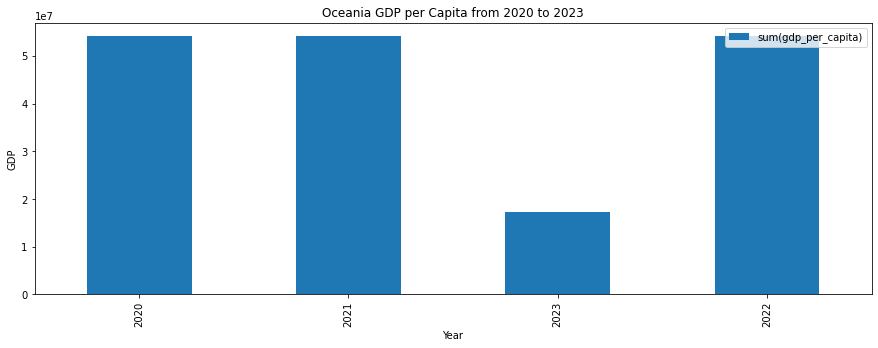

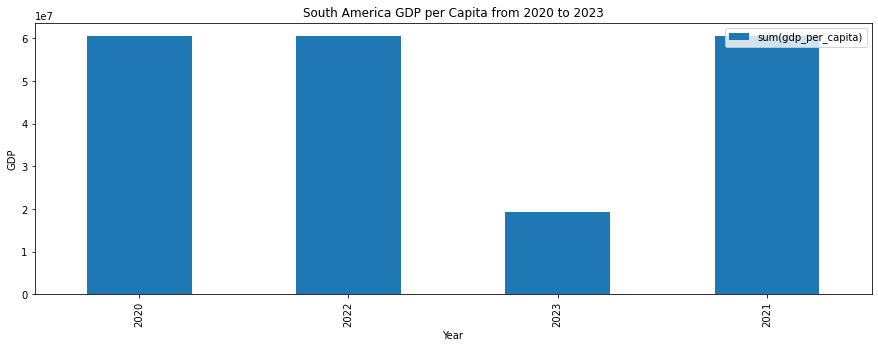

In [0]:
Africa_gdp_pd = gdp_pd[0:4]
Africa_gdp_pd.plot(kind='bar', x='year', y='sum(gdp_per_capita)', figsize=(15, 5))
plt.title('Africa GDP per Capita from 2020 to 2023')
plt.xlabel('Year')
plt.ylabel('GDP')
plt.show()

Asia_gdp_pd = gdp_pd[4:8]
Asia_gdp_pd.plot(kind='bar', x='year', y='sum(gdp_per_capita)', figsize=(15, 5))
plt.title('Asia GDP per Capita from 2020 to 2023')
plt.xlabel('Year')
plt.ylabel('GDP')
plt.show()

Europe_gdp_pd = gdp_pd[8:12]
Europe_gdp_pd.plot(kind='bar', x='year', y='sum(gdp_per_capita)', figsize=(15, 5))
plt.title('Europe GDP per Capita from 2020 to 2023')
plt.xlabel('Year')
plt.ylabel('GDP')
plt.show()

NorthAmerica_gdp_pd = gdp_pd[12:16]
NorthAmerica_gdp_pd.plot(kind='bar', x='year', y='sum(gdp_per_capita)', figsize=(15, 5))
plt.title('North America GDP per Capita from 2020 to 2023')
plt.xlabel('Year')
plt.ylabel('GDP')
plt.show()

Oceania_gdp_pd = gdp_pd[16:20]
Oceania_gdp_pd.plot(kind='bar', x='year', y='sum(gdp_per_capita)', figsize=(15, 5))
plt.title('Oceania GDP per Capita from 2020 to 2023')
plt.xlabel('Year')
plt.ylabel('GDP')
plt.show()

SouthAmerica_gdp_pd = gdp_pd[20:24]
SouthAmerica_gdp_pd.plot(kind='bar', x='year', y='sum(gdp_per_capita)', figsize=(15, 5))
plt.title('South America GDP per Capita from 2020 to 2023')
plt.xlabel('Year')
plt.ylabel('GDP')
plt.show()


In [0]:
import pandas as pd
from pyspark.sql.functions import year
 
# Create another column year and name parse it in another df
total_deathBYyear = df_with_year.groupBy("year").sum("total_deaths")
#Sum by year
total_deathBYyear.show()

+----+-----------------+
|year|sum(total_deaths)|
+----+-----------------+
|2023|    3.324458573E9|
|2022|    9.612599102E9|
|2020|    1.018322294E9|
|2021|    5.965533397E9|
+----+-----------------+



In [0]:
total_deathBYyear = df_with_year.groupBy("median_age").sum("total_deaths")
#Sum by year
total_deathBYyear.show()

+----------+-----------------+
|median_age|sum(total_deaths)|
+----------+-----------------+
|       0.0|  1.0385128215E10|
|      31.9|     1.09650937E8|
|      32.1|          87149.0|
|      33.5|     5.20205593E8|
|      16.8|        2284698.0|
|      25.4|      1.7582102E7|
|      34.3|         536360.0|
|      25.0|        9178778.0|
|      39.8|         261010.0|
|      29.1|     1.99055998E8|
|      27.5|      2.1511057E7|
|      35.7|        6123943.0|
|      42.5|      1.1117382E7|
|      40.3|        4689285.0|
|      38.0|        2651255.0|
|      25.8|        1811055.0|
|      18.6|        5798514.0|
|      41.2|       2.469696E7|
|      41.8|     1.08955742E8|
|      32.4|     1.15408149E8|
+----------+-----------------+
only showing top 20 rows



+---------+-----------------+
|age_range|sum(total_deaths)|
+---------+-----------------+
|        0|  1.0385128215E10|
|       10|       4.116682E7|
|       30|    6.928615981E9|
|       20|    1.352915394E9|
|       40|    1.213086956E9|
+---------+-----------------+



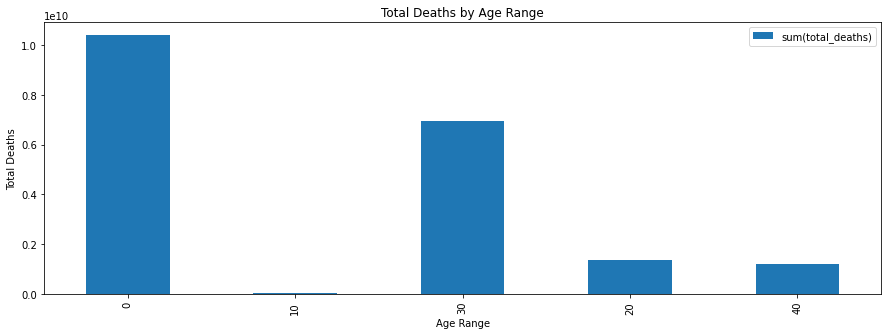

In [0]:
from pyspark.sql.functions import floor
import matplotlib.pyplot as plt

# Add a new column with the age range
df_with_year = df_with_year.withColumn("age_range", floor(df_with_year["median_age"]/10)*10)

# Group by the age range and sum total deaths
total_deaths_by_age_range = df_with_year.groupBy("age_range").sum("total_deaths")

# Show the results
total_deaths_by_age_range.show(40)

# Convert the result to a Pandas dataframe
age_group_pd = total_deaths_by_age_range.toPandas()

# Plot a bar chart of total deaths by age range
age_group_pd.plot(kind='bar', x='age_range', y='sum(total_deaths)', figsize=(15, 5))
plt.title('Total Deaths by Age Range')
plt.xlabel('Age Range')
plt.ylabel('Total Deaths')
plt.show()


+----+----------------------------+
|year|sum(people_fully_vaccinated)|
+----+----------------------------+
|2023|           2.087104336015E12|
|2022|            6.17764303843E12|
|2020|                   1633830.0|
|2021|           1.828885687865E12|
+----+----------------------------+



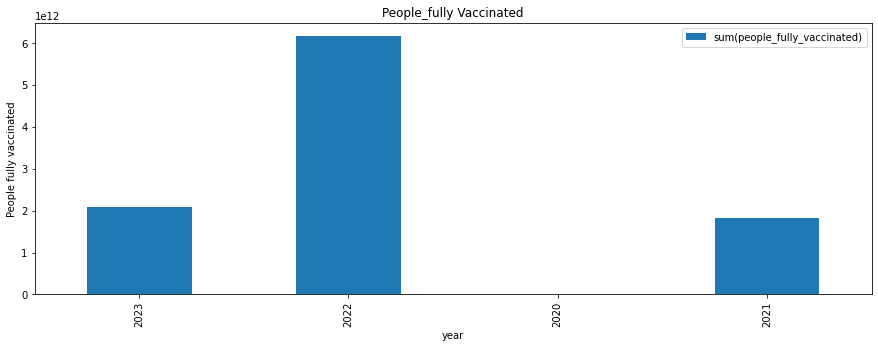

In [0]:
fully_vaccinated = df_with_year.groupBy("year").sum("people_fully_vaccinated")
 
fully_vaccinated.show(40)
# Convert the result to a Pandas dataframe
fully_vaccinated_pd = fully_vaccinated.toPandas()
 
# Plot a bar chart of total deaths by continent and location
fully_vaccinated_pd.plot(kind='bar', x='year', y='sum(people_fully_vaccinated)', figsize=(15, 5))
plt.title('People_fully Vaccinated')
plt.xlabel('year')
plt.ylabel('People fully vaccinated')
plt.show()